<font face="Times New Roman" size=5>
<div dir=rtl align="center">
<font face="Times New Roman" size=5>
In The Name of God
</font>
<br>
<img src="https://logoyar.com/content/wp-content/uploads/2021/04/sharif-university-logo.png" alt="University Logo" width="150" height="150">
<br>
<font face="Times New Roman" size=4 align=center>
Sharif University of Technology - Department of Electrical Engineering
</font>
<br>
<font color="#008080" size=6>
Machine Vision Learning
</font>
<hr/>
<font color="#800080" size=5>
LAB 1 : Basic component analysis
<br>
</font>
<font size=5>
Instructor: Dr. H. Mohammad Zadeh
<br>
</font>
<font size=4>
Fall 2024
<br>
</font>
<font face="Times New Roman" size=4>
</font>

</div></font>

In [1]:
Name = "Ali Sadeghian"
SN = "400101464"

# Libraries

In [2]:
import zipfile
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from io import BytesIO

# PART B

### Introduction:
The goal of this project is to apply Principal Component Analysis (PCA) to a set of face images to reduce dimensionality and explore how eigenfaces can be used for image reconstruction. PCA is a widely used technique in image processing and machine learning that transforms high-dimensional data into a lower-dimensional subspace while preserving the most important features. Eigenfaces are the principal components (eigenvectors) of a covariance matrix that represent key facial features across a dataset. By projecting images onto this reduced subspace, we can reconstruct images with fewer dimensions, maintaining most of the original information. This approach also facilitates visualizing how different numbers of principal components impact the reconstruction quality.





In [3]:
# Function to read images from a zip file and convert them to grayscale
def read_images_from_zip(zip_file_path, folder_in_zip):
    gray_images = []

    # Open the zip file
    with zipfile.ZipFile(zip_file_path, 'r') as archive:
        # Filter PNG files within the specified folder
        file_list = [f for f in archive.namelist() if f.startswith(folder_in_zip) and f.endswith(".png")]

        # Read each image and convert to grayscale
        for file in file_list:
            with archive.open(file) as img_file:
                file_bytes = np.frombuffer(img_file.read(), np.uint8)
                img = cv2.imdecode(file_bytes, cv2.IMREAD_COLOR)
                gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                gray_images.append(gray_img)

    return gray_images

# Function to display a set of images
def plot_images(images, n, title=None):
    plt.figure(figsize=(10, 10))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.axis('off')
    if title is not None:
        plt.title(title, fontsize=16)  # Use suptitle for centered title
    plt.tight_layout()
    plt.show()

# Flatten the images to prepare them for PCA
def flatten_images(images):
    return np.array([img.flatten() for img in images])

# Split the dataset into training and test sets
def split_train_test(data, train_ratio=0.8):
    split_idx = int(len(data) * train_ratio)
    return data[:split_idx], data[split_idx:]

# Zero-center the data by subtracting the mean
def zero_center_data(data):
    return np.mean(data, axis=0)

# PCA function to compute eigenvalues and eigenvectors
def compute_pca(data, mean, m):
    centered_data = data - mean
    U, S, Vt = np.linalg.svd(centered_data, full_matrices=False)
    eigenvectors = Vt[:m, :]
    eigenvalues = (S[:m] ** 2) / (len(centered_data) - 1)
    return eigenvalues, eigenvectors

# Plot eigenfaces (modified to plot 5 eigenfaces per row with reduced spacing)
def plot_eigenfaces(eigenfaces, num_eigenfaces=10, eigenfaces_per_row=5,title =None):
    plt.figure(figsize=(eigenfaces_per_row*2,num_eigenfaces*0.9))  # Adjusted figure size for better control
    rows = (num_eigenfaces + eigenfaces_per_row - 1) // eigenfaces_per_row  # n eigenfaces per row

    for i in range(num_eigenfaces):
        plt.subplot(rows, eigenfaces_per_row, i + 1)
        plt.imshow(eigenfaces[i], cmap='gray')
        plt.title(f'Eigenface {i + 1}', fontsize=10)
        plt.axis('off')
    if title is not None:
        plt.title(title, fontsize=16)  # Use suptitle for centered title
    plt.subplots_adjust(wspace=0.05, hspace=0)  # Reduce spacing between plots
    plt.tight_layout(pad=0.5)  # Minimize padding
    plt.show()


# Reconstruct an image using a set of eigenvectors and coefficients
def reconstruct_image(coefficients, eigenvectors, mean_vector,m_components = 10):
    return np.dot(coefficients[:, :m_components], eigenvectors[:m_components]) + mean_vector

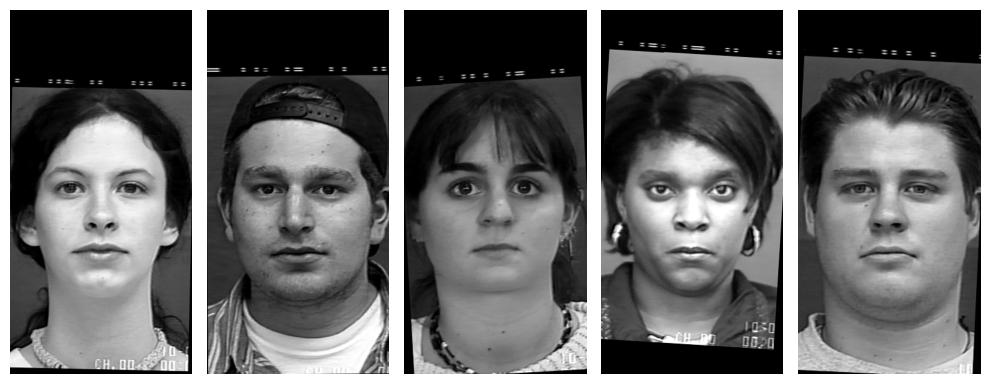

In [4]:
# Main part of the code
zip_file_path = 'data_set_image.zip'
folder_in_zip = 'neutral/'

n_images_to_plot = 5

# Read and display grayscale images
gray_images = read_images_from_zip(zip_file_path, folder_in_zip)
Height, Width = gray_images[0].shape

if len(gray_images) == 0:
    print("No images found in the specified folder.")
plot_images(gray_images, n_images_to_plot)

In [5]:
# Flatten the images and split into training and test sets
flattened_images = flatten_images(gray_images)
train_data, test_data = split_train_test(flattened_images)
num_of_train = train_data.shape[0]
print(type(flattened_images))
print(flattened_images.shape)
print(num_of_train)

<class 'numpy.ndarray'>
(190, 180000)
152


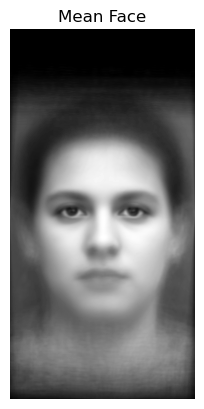

In [6]:
# Zero-center the data (find the mean image)
mean_vector = zero_center_data(train_data)
mean_vector_image_reshaped = mean_vector.reshape(Height, Width)
plt.imshow(mean_vector_image_reshaped, cmap='gray')
plt.title('Mean Face')
plt.axis('off')
plt.show()

In [7]:
m_components_a = 10
m_components_b = 20

m_components = max(m_components_a,m_components_b)

eigenvalues, eigenvectors = compute_pca(train_data,mean_vector, m_components)

print(f"Top {m_components} Eigenvalues: {eigenvalues}")

Top 20 Eigenvalues: [92972471.60836336 70162142.69258772 29068385.97769297 21175323.23847134
 20308367.50975367 18945608.96015649 13903808.31421042 12341575.97786922
  9989334.96923181  9512031.48826453  8052615.60934862  7427329.89201484
  6304327.66594182  5957851.64920392  5729586.61724773  5355556.31512777
  5010869.68864498  4759203.74173013  4555372.83034957  4342982.971548  ]


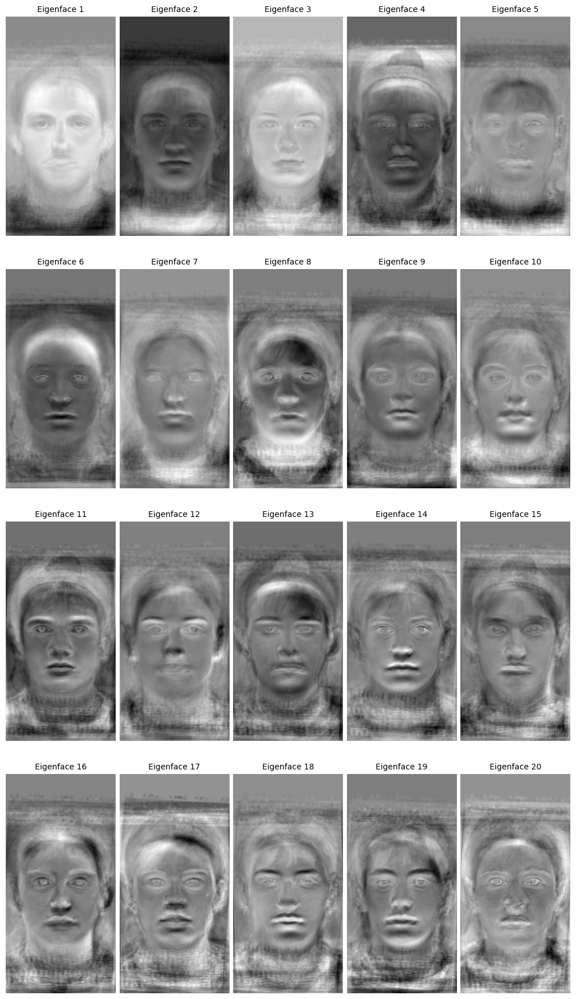

In [8]:
# Reshape eigenvectors into eigenfaces and plot them
eigenfaces = eigenvectors.reshape((eigenvectors.shape[0], Height, Width))
plot_eigenfaces(eigenfaces, eigenvectors.shape[0])

In [9]:
coefficients = np.dot(train_data - mean_vector, eigenvectors.T)

reconstructed_image = reconstruct_image(coefficients, eigenvectors, mean_vector,m_components_a)
reconstructed_image_reshaped = reconstructed_image.reshape((coefficients.shape[0],gray_images[0].shape[0],gray_images[0].shape[1]))

reconstructed_image_p = reconstruct_image(coefficients, eigenvectors, mean_vector,m_components_b)
reconstructed_image_reshaped_p = reconstructed_image.reshape((coefficients.shape[0],gray_images[0].shape[0],gray_images[0].shape[1]))

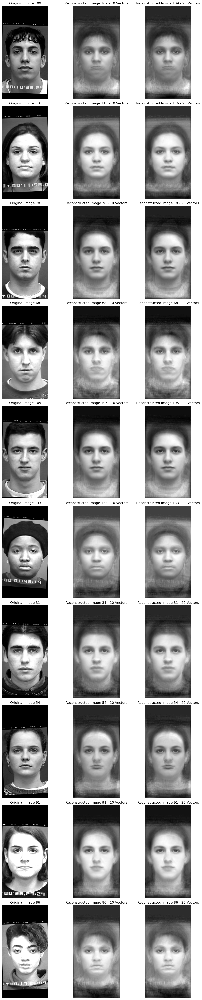

In [10]:
# Plot original and reconstructed images
num_images_to_plot = 10
random_indices = np.random.choice(len(reconstructed_image_reshaped), num_images_to_plot, replace=False)

plt.figure(figsize=(12, 5 * num_images_to_plot))
for i, idx in enumerate(random_indices):
    plt.subplot(num_images_to_plot, 3, i * 3 + 1)
    plt.title(f"Original Image {idx}")
    plt.imshow(gray_images[idx], cmap='gray')
    plt.axis('off')

    plt.subplot(num_images_to_plot, 3, i * 3 + 2)
    plt.title(f"Reconstructed Image {idx} - 10 Vectors")
    plt.imshow(reconstructed_image_reshaped[idx], cmap='gray')
    plt.axis('off')

    plt.subplot(num_images_to_plot, 3, i * 3 + 3)
    plt.title(f"Reconstructed Image {idx} - 20 Vectors")
    plt.imshow(reconstructed_image_reshaped_p[idx], cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

As the number of eigenvectors increases in the PCA method, the shape becomes slightly sharper, but the overall structure of the shapes does not change. Additionally, since the eigenvectors carry more energy, the general form of the image is reconstructed.

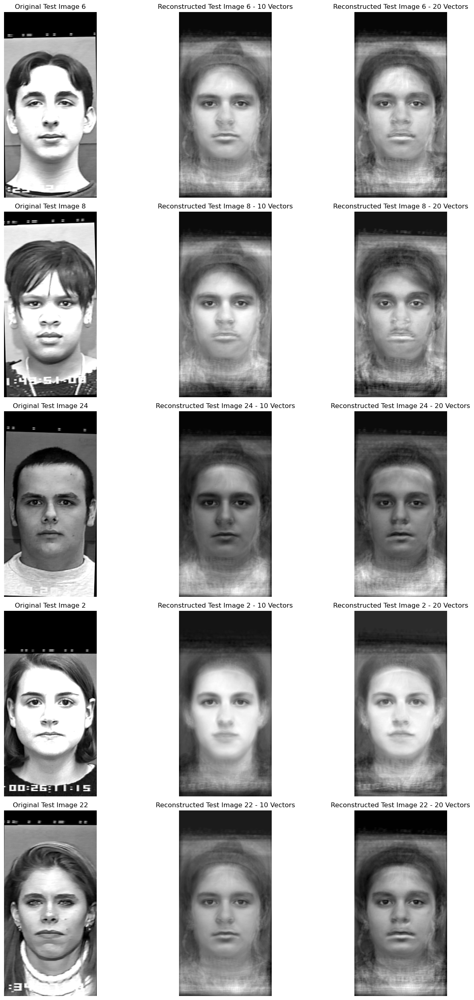

In [11]:
# Apply reconstruction to test data
test_data_centered = test_data - mean_vector
test_coefficients = np.dot(test_data_centered, eigenvectors.T)

reconstructed_test_images = reconstruct_image(test_coefficients, eigenvectors, mean_vector,m_components_a)
reconstructed_test_images_p = reconstruct_image(test_coefficients, eigenvectors, mean_vector,m_components_b)


# Plot original and reconstructed test images
num_test_images_to_plot = 5
random_indices = np.random.choice(len(test_data), num_test_images_to_plot, replace=False)

plt.figure(figsize=(15, 5 * num_test_images_to_plot))
for i, idx in enumerate(random_indices):
    plt.subplot(num_test_images_to_plot, 3, i * 3 + 1)
    plt.title(f"Original Test Image {idx}")
    plt.imshow(gray_images[idx + len(train_data)], cmap='gray')
    plt.axis('off')

    plt.subplot(num_test_images_to_plot, 3, i * 3 + 2)
    plt.title(f"Reconstructed Test Image {idx} - 10 Vectors")
    plt.imshow(reconstructed_test_images[idx].reshape(Height, Width), cmap='gray')
    plt.axis('off')

    plt.subplot(num_test_images_to_plot, 3, i * 3 + 3)
    plt.title(f"Reconstructed Test Image {idx} - 20 Vectors")
    plt.imshow(reconstructed_test_images_p[idx].reshape(Height, Width), cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

Given that the eigenvectors have learned the facial features of individuals (such as the roundness of the face, the relative positions of facial elements, the mouth, eyes, etc.), and since these components are similar across all humans, the reconstruction of faces has been done ok.

### Approach and Assumptions:
1. **Data Loading and Preprocessing**:
   - The input consists of grayscale face images stored in a compressed ZIP archive. These images are first read and converted into a 2D format, then flattened into 1D arrays to prepare them for PCA.
   - The dataset is split into training and test sets using an 80-20 ratio. The training set is used to compute the mean face and the principal components (eigenfaces), while the test set is used to evaluate the reconstruction capabilities of the model.

2. **Mean Face and Zero-Centering**:
   - The training data is zero-centered by subtracting the mean face, which ensures that the PCA captures variations in the face dataset rather than being biased by absolute pixel intensity levels.
   - It is assumed that the zero-centered data allows PCA to focus on identifying the significant variations (e.g., facial features like eyes, nose, mouth) within the dataset.

3. **PCA Computation**:
   - Singular Value Decomposition (SVD) is used to compute the eigenvalues and eigenvectors of the zero-centered training data. The first 10 and 20 eigenvectors are retained to construct the eigenfaces and explore how different numbers of components affect image reconstruction.
   - Eigenvalues represent the importance (variance explained) of each eigenvector. Larger eigenvalues correspond to eigenvectors that capture more significant features of the dataset.

4. **Reconstruction and Coefficients**:
   - The face images are projected onto the subspace spanned by the eigenfaces to obtain coefficients, which represent the contribution of each eigenface to a specific image.
   - Reconstruction of images is done by multiplying the coefficients with the eigenvectors and adding the mean face back to the data. We assume that reconstructing an image using a limited number of eigenvectors will approximate the original image, with higher numbers of eigenvectors leading to better approximations.

5. **Visualization and Comparison**:
   - Eigenfaces are visualized to show the principal components learned by PCA. These eigenfaces capture the key facial features common across the dataset.
   - The original and reconstructed images are compared by reconstructing with both 10 and 20 eigenvectors. This allows us to visually assess how the number of principal components influences the quality of the reconstruction.
   - For testing, unseen images are reconstructed using the eigenfaces obtained from the training data, allowing us to evaluate how well the model generalizes to new images.

### Assumptions:
- **Uniform Face Structure**: The images of faces are assumed to have a consistent structure (e.g., similar alignment, frontal faces). This consistency allows PCA to effectively capture the key variations across the dataset.
- **Energy Preservation**: It is assumed that most of the information (variance) in the face dataset is captured by a relatively small number of principal components. The number of principal components selected (10 and 20) is expected to preserve enough energy (variance) to reconstruct the images with reasonable accuracy.
- **Zero-Centered Data**: The assumption here is that subtracting the mean face from the dataset allows PCA to capture meaningful differences between faces rather than being influenced by the average pixel intensities across the entire dataset.

# PART C


### Introduction
In the field of computer vision and facial recognition, the ability to reconstruct facial expressions using Principal Component Analysis (PCA) is pivotal. This study focuses on analyzing facial images of different emotions—neutral, happy, surprise, and disgust—by applying PCA for reconstruction and evaluation. By examining how neutral expressions can be transformed into other emotional representations, we gain insights into the preservation of identity and emotional characteristics in facial imagery.


In [12]:
# Define paths for image datasets in the zip file
zip_file_path = 'data_set_image.zip'
neutral_in_zip = 'neutral/'
happy_in_zip = 'happy/'
surprise_in_zip = 'surprise/'
disgust_in_zip = 'disgust/'

# Number of images to plot
n_images_to_plot = 5

# Read images from the specified folders in the zip file
gray_image_neutral = read_images_from_zip(zip_file_path, neutral_in_zip)
gray_images_happy = read_images_from_zip(zip_file_path, happy_in_zip)
gray_images_surprise = read_images_from_zip(zip_file_path, surprise_in_zip)
gray_images_disgust = read_images_from_zip(zip_file_path, disgust_in_zip)

# Extract image dimensions for each emotion category
Height_n, Width_n = gray_image_neutral[0].shape
Height_h, Width_h = gray_images_happy[0].shape
Height_s, Width_s = gray_images_surprise[0].shape
Height_d, Width_d = gray_images_disgust[0].shape

# Check if images were found in each category and print a message if not
if len(gray_images_happy) == 0:
    print("No images found in the specified folder Happy.")
if len(gray_images_surprise) == 0:
    print("No images found in the specified folder Surprise.")
if len(gray_images_disgust) == 0:
    print("No images found in the specified folder Disgust.")

In [13]:
# Function to create an elliptical mask for face detection
def mask_face_ellipse(image, width_factor=0.8, height_factor=0.6):
    height, width = image.shape
    center_x, center_y = width // 2, height // 2
    axis_x = int(width // 2 * width_factor)
    axis_y = int(height // 2 * height_factor)

    # Create a mask using an ellipse
    mask = np.zeros_like(image, dtype=np.uint8)
    cv2.ellipse(mask, (center_x, center_y), (axis_x, axis_y), 0, 0, 360, 255, thickness=-1)

    # Apply the mask to the image
    masked_image = cv2.bitwise_and(image, image, mask=mask)
    return masked_image

# Function to mask a dataset of images using an elliptical mask
def mask_dataset_ellipse(dataset, width_factor=0.8, height_factor=0.6):
    masked_dataset = []
    for image in dataset:
        masked_image = mask_face_ellipse(image, width_factor, height_factor)
        masked_dataset.append(masked_image)
    return masked_dataset

In [14]:
# Apply masks to datasets
gray_image_n_m = mask_dataset_ellipse(gray_image_neutral)
gray_image_h_m = mask_dataset_ellipse(gray_images_happy)
gray_image_s_m = mask_dataset_ellipse(gray_images_surprise)
gray_image_d_m = mask_dataset_ellipse(gray_images_disgust)

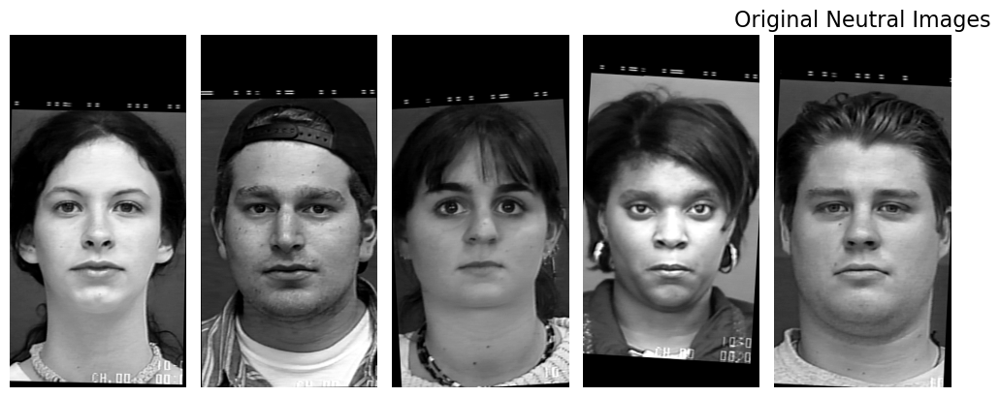

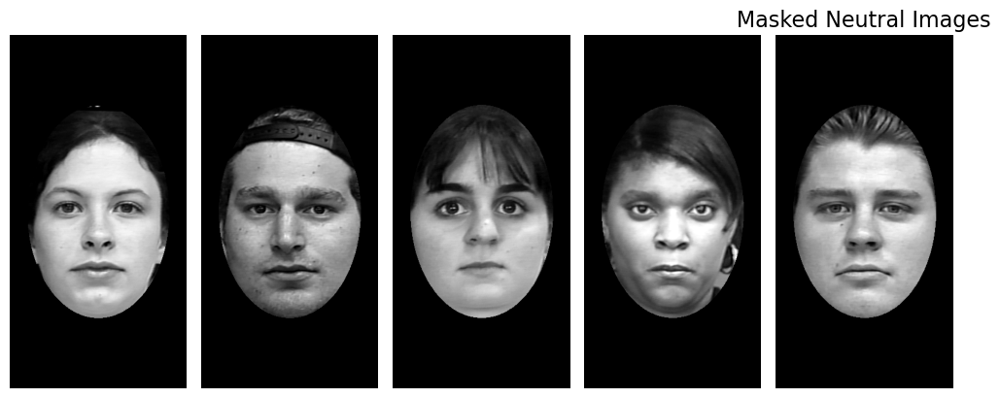

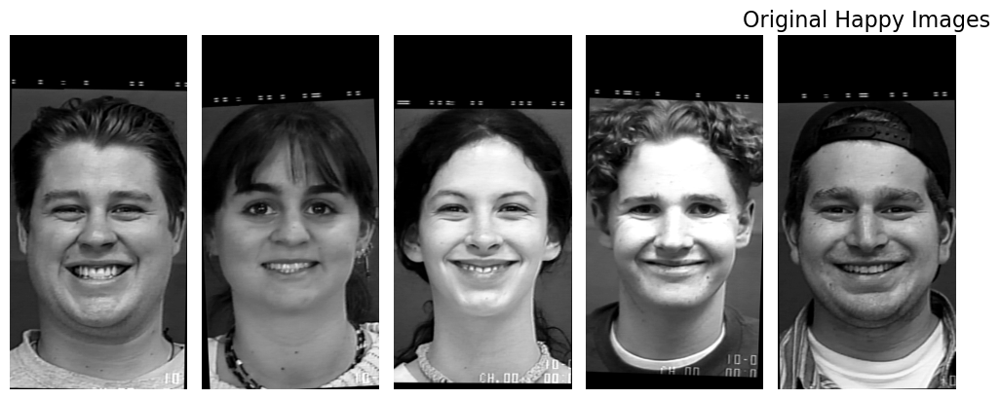

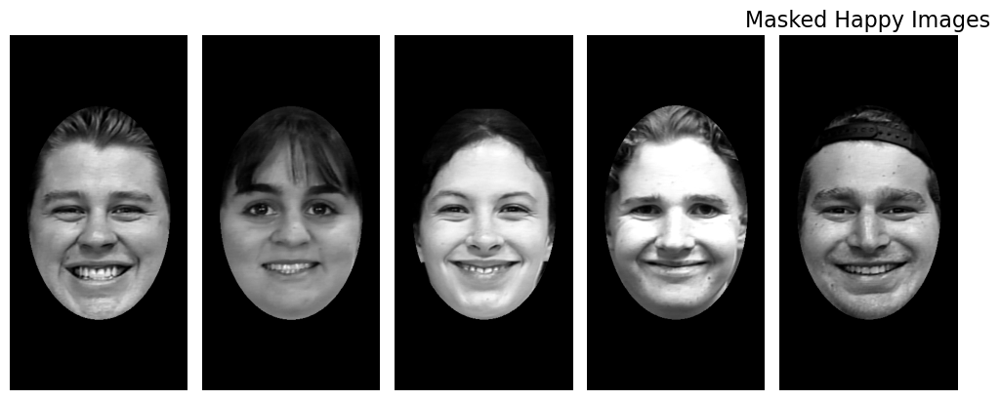

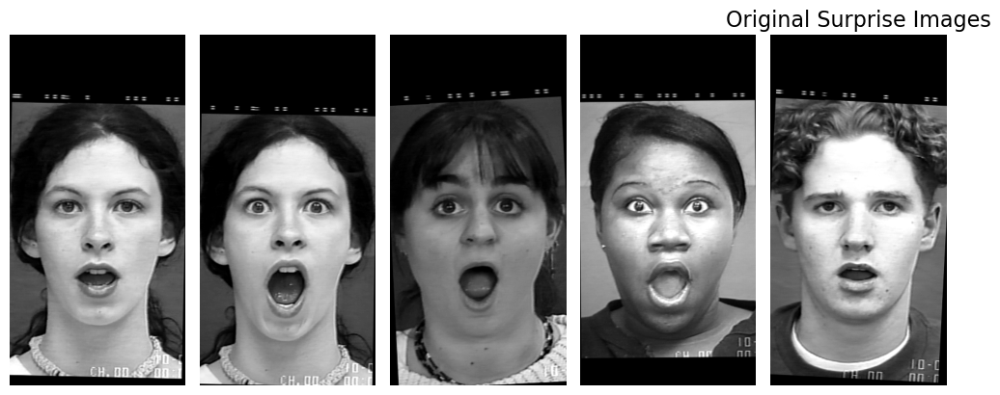

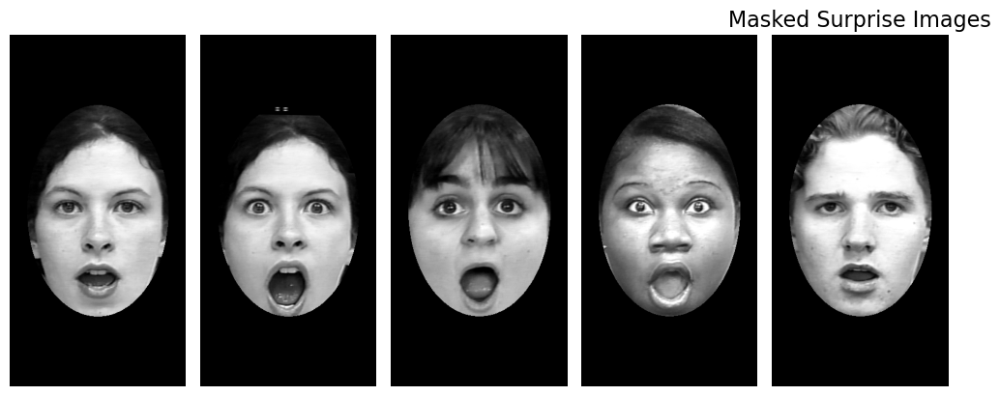

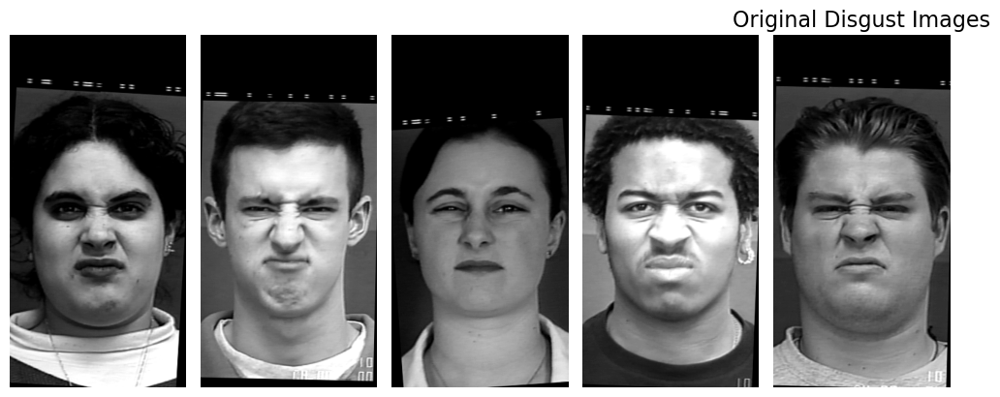

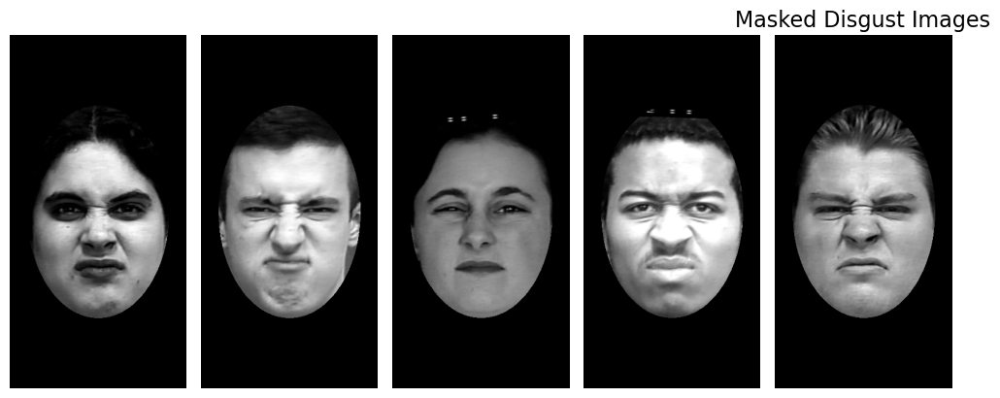

In [15]:
# Plot original and masked images for Neutral emotions
plot_images(gray_image_neutral, n_images_to_plot,'Original Neutral Images')
plot_images(gray_image_n_m, n_images_to_plot,'Masked Neutral Images')

# Plot original and masked images for Happy emotions
plot_images(gray_images_happy, n_images_to_plot,'Original Happy Images')
plot_images(gray_image_h_m, n_images_to_plot,'Masked Happy Images')

# Plot original and masked images for Surprise emotions
plot_images(gray_images_surprise, n_images_to_plot,'Original Surprise Images')
plot_images(gray_image_s_m, n_images_to_plot,'Masked Surprise Images')

# Plot original and masked images for Disgust emotions
plot_images(gray_images_disgust, n_images_to_plot,'Original Disgust Images')
plot_images(gray_image_d_m, n_images_to_plot,'Masked Disgust Images')

In [16]:
# Flatten the masked images for further processing
flattened_images_n = flatten_images(gray_image_n_m)
flattened_images_h = flatten_images(gray_image_h_m)
flattened_images_s = flatten_images(gray_image_s_m)
flattened_images_d = flatten_images(gray_image_d_m)

# Print shapes of the flattened images
print(f"Flattened Neutral Images Shape: {flattened_images_n.shape}")
print(f"Flattened Happy Images Shape: {flattened_images_h.shape}")
print(f"Flattened Surprise Images Shape: {flattened_images_s.shape}")
print(f"Flattened Disgust Images Shape: {flattened_images_d.shape}")


Flattened Neutral Images Shape: (190, 180000)
Flattened Happy Images Shape: (85, 180000)
Flattened Surprise Images Shape: (88, 180000)
Flattened Disgust Images Shape: (47, 180000)


C:\Users\user\AppData\Local\Temp\ipykernel_16472\2694074855.py:31: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout(rect=[0, 0, 0, 0.95])  # Leave space for the suptitle


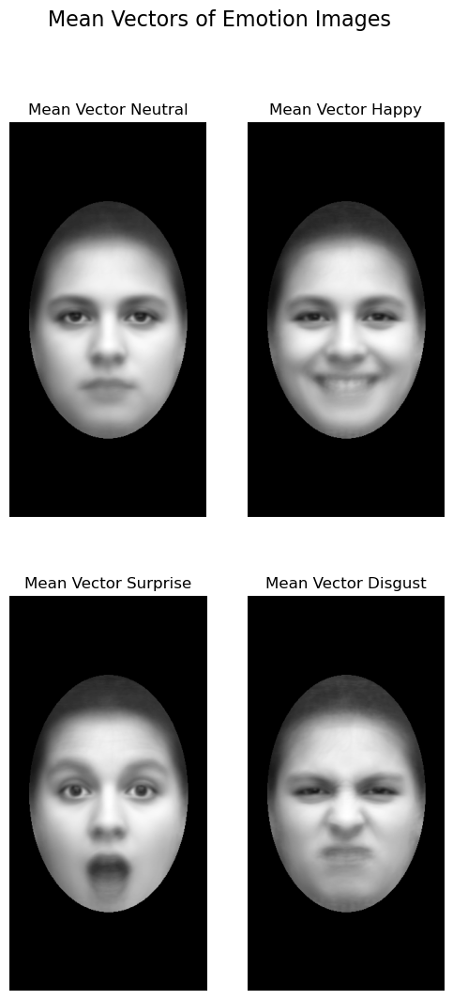

In [17]:
# Reshape and plot mean vectors
def plot_mean_vector(mean_vector, Height, Width, title):
    mean_vector_reshaped = mean_vector.reshape(Height, Width)
    plt.imshow(mean_vector_reshaped, cmap='gray')
    plt.axis('off')
    plt.title(title)

mean_vector_n = zero_center_data(flattened_images_n)
mean_vector_h = zero_center_data(flattened_images_h)
mean_vector_s = zero_center_data(flattened_images_s)
mean_vector_d = zero_center_data(flattened_images_d)

# Create a figure with 2 rows and 2 columns for the mean vectors
plt.figure(figsize=(6, 12))
plt.suptitle('Mean Vectors of Emotion Images', fontsize=16)

# Create subplots for each mean vector
plt.subplot(2, 2, 1)  # First subplot
plot_mean_vector(mean_vector_n, Height_n, Width_n, 'Mean Vector Neutral')

plt.subplot(2, 2, 2)  # Second subplot
plot_mean_vector(mean_vector_h, Height_h, Width_h, 'Mean Vector Happy')

plt.subplot(2, 2, 3)  # Third subplot
plot_mean_vector(mean_vector_s, Height_s, Width_s, 'Mean Vector Surprise')

plt.subplot(2, 2, 4)  # Fourth subplot
plot_mean_vector(mean_vector_d, Height_d, Width_d, 'Mean Vector Disgust')

# Adjust layout to avoid overlap
plt.tight_layout(rect=[0, 0, 0, 0.95])  # Leave space for the suptitle
plt.show()


In [18]:
# Perform PCA for Happy images
m_components_a = 10
m_components_b = 20
m_components = max(m_components_a,m_components_b)

# Perform PCA for Happy images
eigenvalues_h, eigenvectors_h = compute_pca(flattened_images_h, mean_vector_h, m_components)
print(f"Top {m_components} Eigenvalues for Happy: {eigenvalues_h}")

# Perform PCA for Surprise images
eigenvalues_s, eigenvectors_s = compute_pca(flattened_images_s, mean_vector_s, m_components)
print(f"Top {m_components} Eigenvalues for Surprise: {eigenvalues_s}")

# Perform PCA for Disgust images
eigenvalues_d, eigenvectors_d = compute_pca(flattened_images_d, mean_vector_d, m_components)
print(f"Top {m_components} Eigenvalues for Disgust: {eigenvalues_d}")

Top 20 Eigenvalues for Happy: [83179527.02908556 19242124.10316966  9035257.24579248  8268274.88839572
  6062322.96741245  5036604.34407309  4728825.21013697  3968507.61442039
  3485275.88900081  3095391.23699082  2912467.02739615  2606703.52020237
  2305732.31681272  2080679.1538681   2024945.96762488  1737720.98749862
  1683250.09086105  1499798.6737477   1388518.83688895  1315834.77486326]
Top 20 Eigenvalues for Surprise: [83827979.87756065 18900104.54288429  9477260.37974174  7816968.5403989
  5697241.81861295  4702364.18339886  4431373.77892676  4071176.35882542
  3539410.91185706  3032868.05139935  2950038.93460154  2420813.4720375
  2364243.58742143  2198666.66499938  2057203.87194509  1740540.20409911
  1575901.59487328  1500149.60800755  1439286.36851262  1397863.02433689]
Top 20 Eigenvalues for Disgust: [99688614.3093972  16051554.91035291 14467709.33449758  7747983.08919696
  6379501.11966996  5566785.38613729  4985319.3865492   4689116.83405353
  3613832.51467715  3545318.1

Eigenfaces of Happy


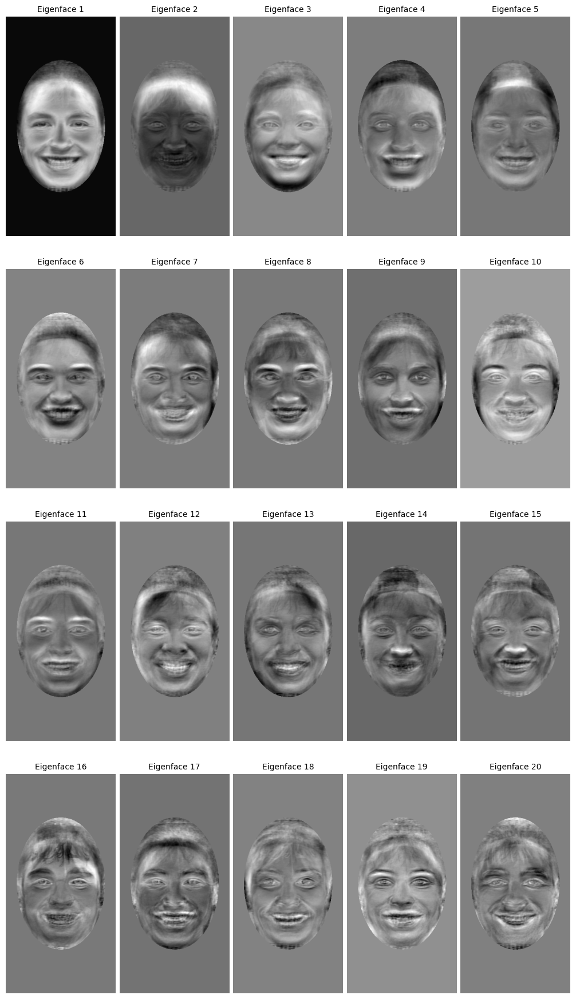

Eigenfaces of Surprise


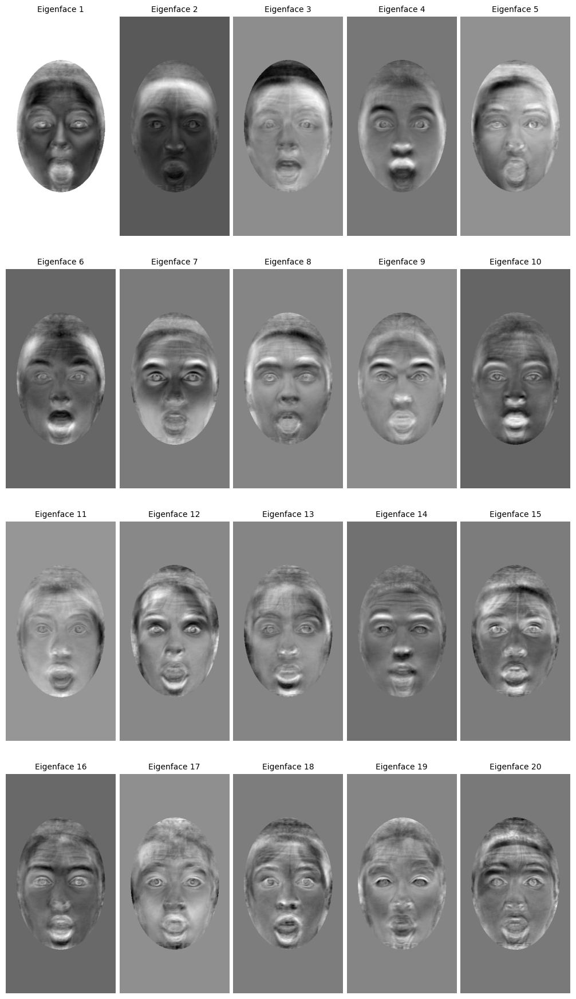

Eigenfaces of Disgust


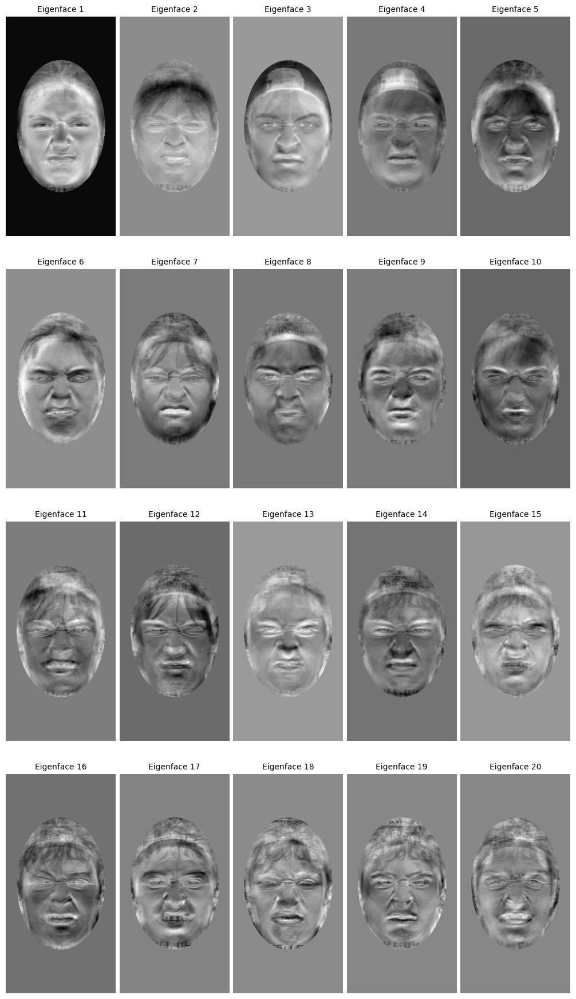

In [19]:
# Plot Eigenfaces for Happy, Surprise, and Disgust
eigenfaces_h = eigenvectors_h.reshape((eigenvectors_h.shape[0], Height_h, Width_h))
print("Eigenfaces of Happy")
plot_eigenfaces(eigenfaces_h, eigenvectors_h.shape[0])
print("Eigenfaces of Surprise")
eigenfaces_s = eigenvectors_s.reshape((eigenvectors_s.shape[0], Height_s, Width_s))
plot_eigenfaces(eigenfaces_s, eigenvectors_s.shape[0])
print("Eigenfaces of Disgust")
eigenfaces_d = eigenvectors_d.reshape((eigenvectors_d.shape[0], Height_d, Width_d))
plot_eigenfaces(eigenfaces_d, eigenvectors_d.shape[0])

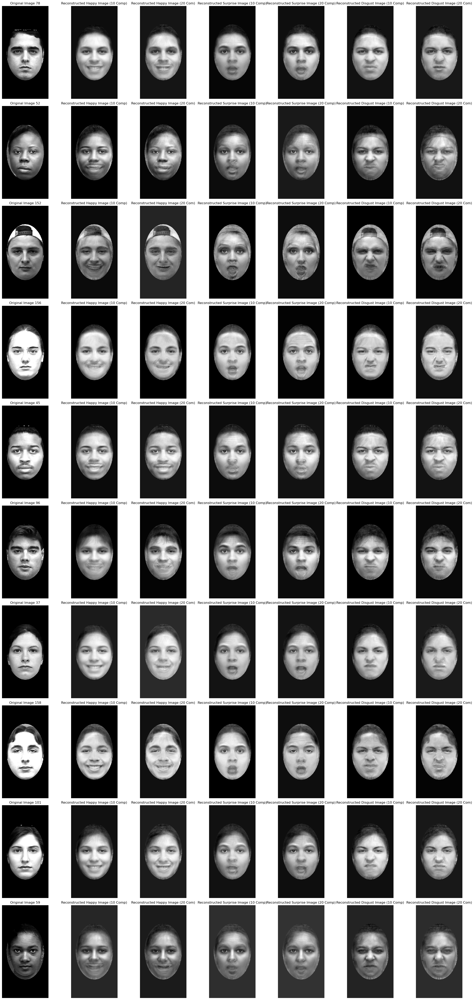

In [20]:
# Calculate test coefficients for reconstructed images based on PCA
test_coefficients_h = np.dot(flattened_images_n - mean_vector_h, eigenvectors_h.T)  # Coefficients for happy images
test_coefficients_s = np.dot(flattened_images_n - mean_vector_s, eigenvectors_s.T)  # Coefficients for surprise images
test_coefficients_d = np.dot(flattened_images_n - mean_vector_d, eigenvectors_d.T)  # Coefficients for disgust images

# Reconstruct images using the calculated coefficients and specified number of components
reconstructed_test_images_h = reconstruct_image(test_coefficients_h, eigenvectors_h, mean_vector_h, m_components_a)  # Reconstructed happy images with 'm_components_a'
reconstructed_test_images_h_p = reconstruct_image(test_coefficients_h, eigenvectors_h, mean_vector_h, m_components_b)  # Reconstructed happy images with 'm_components_b'

reconstructed_test_images_s = reconstruct_image(test_coefficients_s, eigenvectors_s, mean_vector_s, m_components_a)  # Reconstructed surprise images with 'm_components_a'
reconstructed_test_images_s_p = reconstruct_image(test_coefficients_s, eigenvectors_s, mean_vector_s, m_components_b)  # Reconstructed surprise images with 'm_components_b'

reconstructed_test_images_d = reconstruct_image(test_coefficients_d, eigenvectors_d, mean_vector_d, m_components_a)  # Reconstructed disgust images with 'm_components_a'
reconstructed_test_images_d_p = reconstruct_image(test_coefficients_d, eigenvectors_d, mean_vector_d, m_components_b)  # Reconstructed disgust images with 'm_components_b'

# Set the number of test images to plot
num_test_images_to_plot = 10

# Check if the number of images to plot exceeds available images
if num_test_images_to_plot > len(flattened_images_n):
    print("Number of test images to plot exceeds available images.")
else:
    random_indices = np.random.choice(len(flattened_images_n), num_test_images_to_plot, replace=False)

    # Define the figure size, adjust height to accommodate all rows of subplots
    plt.figure(figsize=(25, 5 * num_test_images_to_plot))

    for i, idx in enumerate(random_indices):
        # Original Test Image
        plt.subplot(num_test_images_to_plot, 7, i * 7 + 1)
        plt.title(f"Original Image {idx}")  # Updated title for clarity
        plt.imshow(gray_image_n_m[idx], cmap='gray', interpolation='nearest')
        plt.axis('off')

        # Reconstructed Test Image for Happy Emotion (10 components)
        plt.subplot(num_test_images_to_plot, 7, i * 7 + 2)
        plt.title(f"Reconstructed Happy Image (10 Comp)")  # Clearer title
        plt.imshow(reconstructed_test_images_h[idx].reshape(Height_h, Width_h), cmap='gray', interpolation='nearest')
        plt.axis('off')

        # Reconstructed Test Image for Happy Emotion (20 components)
        plt.subplot(num_test_images_to_plot, 7, i * 7 + 3)
        plt.title(f"Reconstructed Happy Image (20 Com)")  # Clearer title
        plt.imshow(reconstructed_test_images_h_p[idx].reshape(Height_h, Width_h), cmap='gray', interpolation='nearest')
        plt.axis('off')

        # Reconstructed Test Image for Surprise Emotion (10 components)
        plt.subplot(num_test_images_to_plot, 7, i * 7 + 4)
        plt.title(f"Reconstructed Surprise Image (10 Comp)")  # Clearer title
        plt.imshow(reconstructed_test_images_s[idx].reshape(Height_s, Width_s), cmap='gray', interpolation='nearest')
        plt.axis('off')

        # Reconstructed Test Image for Surprise Emotion (20 components)
        plt.subplot(num_test_images_to_plot, 7, i * 7 + 5)
        plt.title(f"Reconstructed Surprise Image (20 Comp)")  # Clearer title
        plt.imshow(reconstructed_test_images_s_p[idx].reshape(Height_s, Width_s), cmap='gray', interpolation='nearest')
        plt.axis('off')

        # Reconstructed Test Image for Disgust Emotion (10 components)
        plt.subplot(num_test_images_to_plot, 7, i * 7 + 6)
        plt.title(f"Reconstructed Disgust Image (10 Comp)")  # Clearer title
        plt.imshow(reconstructed_test_images_d[idx].reshape(Height_d, Width_d), cmap='gray', interpolation='nearest')
        plt.axis('off')

        # Reconstructed Test Image for Disgust Emotion (20 components)
        plt.subplot(num_test_images_to_plot, 7, i * 7 + 7)
        plt.title(f"Reconstructed Disgust Image (20 Com)")  # Clearer title
        plt.imshow(reconstructed_test_images_d_p[idx].reshape(Height_d, Width_d), cmap='gray', interpolation='nearest')
        plt.axis('off')

    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.show()  # Display the images



### Approach
1. **Data Preparation**: Images of various emotions are organized into specific directories. The images are read and converted to grayscale to ensure uniformity during analysis. A mask is applied to focus on facial features, enhancing the reconstruction process.
  
2. **PCA Implementation**: The PCA technique is employed on the flattened images of neutral, happy, surprise, and disgust emotions to extract the essential features and components. The mean vectors and eigenvectors for each emotion are calculated, enabling us to capture the variability in the data effectively.
  
3. **Reconstruction**: Using the principal components obtained from PCA, neutral images are reconstructed in the context of the three emotional states—happy, surprise, and disgust. For each reconstructed image, two sets of components (10 and 20) are utilized to analyze the effects of dimensionality on reconstruction quality.

4. **Analysis**: A selection of 10 random neutral images is reconstructed across the different emotional contexts. The visual quality of the reconstructions is evaluated to determine whether identity and emotional expressions are preserved.

### Assumptions
- The facial images used are well-aligned, allowing for effective masking and reconstruction.
- The emotional expressions in the images are distinct enough for PCA to capture and reconstruct meaningful variations.
- The reconstruction relies on PCA, which assumes linearity in data representation; hence, subtle nuances of emotion might not be perfectly reconstructed.

### Observations and Analysis
After reconstructing 10 randomly selected neutral images into the happy, surprise, and disgust categories, the following observations can be made:

1. **Identity Preservation**: The identity of individuals is generally preserved in the reconstructed images, particularly in the case of happy and surprise expressions. However, subtle features might become less distinct, especially under the influence of emotional attributes. The level of identity retention varies with the number of components used; more components tend to maintain more detail.

2. **Emotional Expression Changes**: The reconstructed images display noticeable changes in emotional expression. The facial features typical of happiness, such as a smiling mouth and raised eyebrows, become apparent in the corresponding reconstructed happy images. Similarly, surprise is characterized by widened eyes and raised eyebrows, while disgust shows a wrinkled nose and frowning mouth. This indicates that the PCA method can effectively translate neutral expressions into recognizable emotional states.

3. **Quality of Reconstruction**: Certain facial components, such as the eyes and mouth, are reconstructed with greater fidelity than others. For instance, the eye region tends to maintain clarity, while fine details in the mouth region may be less distinct. The use of 20 components often leads to better overall quality, capturing more nuances of the facial features than the 10-component reconstructions.

